In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from  plot_learning_curve import plot_learning_curve
from eda_plots import diagnostic_plots, plot_target_by_category

In [23]:
data = pd.read_csv('train (2).csv')
test_data = pd.read_csv('test (2).csv')

In [178]:
data.head()

,id,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,36,Travel_Frequently,599,Research & Development,24,3,Medical,1,4,...,80,1,10,2,3,10,0,7,8,0
1,1,35,Travel_Rarely,921,Sales,8,3,Other,1,1,...,80,1,4,3,3,4,2,0,3,0
2,2,32,Travel_Rarely,718,Sales,26,3,Marketing,1,3,...,80,2,4,3,3,3,2,1,2,0
3,3,38,Travel_Rarely,1488,Research & Development,2,3,Medical,1,3,...,80,0,15,1,1,6,0,0,2,0
4,4,50,Travel_Rarely,1017,Research & Development,5,4,Medical,1,2,...,80,0,31,0,3,31,14,4,10,1


In [102]:
data.columns

Index(['id', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition'],
      dtype='object')

In [103]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1677 entries, 0 to 1676
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   id                        1677 non-null   int64 
 1   Age                       1677 non-null   int64 
 2   BusinessTravel            1677 non-null   object
 3   DailyRate                 1677 non-null   int64 
 4   Department                1677 non-null   object
 5   DistanceFromHome          1677 non-null   int64 
 6   Education                 1677 non-null   int64 
 7   EducationField            1677 non-null   object
 8   EmployeeCount             1677 non-null   int64 
 9   EnvironmentSatisfaction   1677 non-null   int64 
 10  Gender                    1677 non-null   object
 11  HourlyRate                1677 non-null   int64 
 12  JobInvolvement            1677 non-null   int64 
 13  JobLevel                  1677 non-null   int64 
 14  JobRole                 

In [24]:
data = data.drop('id', axis=1)

In [180]:
data.nunique()

Age                          43
BusinessTravel                3
DailyRate                   625
Department                    3
DistanceFromHome             29
Education                     6
EducationField                6
EmployeeCount                 1
EnvironmentSatisfaction       4
Gender                        2
HourlyRate                   71
JobInvolvement                4
JobLevel                      6
JobRole                       9
JobSatisfaction               4
MaritalStatus                 3
MonthlyIncome               895
MonthlyRate                 903
NumCompaniesWorked           10
Over18                        1
OverTime                      2
PercentSalaryHike            15
PerformanceRating             2
RelationshipSatisfaction      4
StandardHours                 1
StockOptionLevel              4
TotalWorkingYears            41
TrainingTimesLastYear         7
WorkLifeBalance               4
YearsAtCompany               34
YearsInCurrentRole           19
YearsSin

In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1677.0,36.036971,8.507112,18.0,30.0,35.0,41.0,60.0
DailyRate,1677.0,892.749553,374.496259,107.0,589.0,890.0,1223.0,3921.0
DistanceFromHome,1677.0,8.683959,7.826143,1.0,2.0,7.0,12.0,29.0
Education,1677.0,2.937984,1.039078,1.0,2.0,3.0,4.0,15.0
EmployeeCount,1677.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
EnvironmentSatisfaction,1677.0,2.757901,1.086835,1.0,2.0,3.0,4.0,4.0
HourlyRate,1677.0,67.798450,19.435928,30.0,51.0,69.0,84.0,100.0
JobInvolvement,1677.0,2.782349,0.650664,1.0,2.0,3.0,3.0,4.0
JobLevel,1677.0,1.998807,1.083065,1.0,1.0,2.0,2.0,7.0
JobSatisfaction,1677.0,2.791890,1.097396,1.0,2.0,3.0,4.0,4.0


In [15]:
# To check the duplicates of the data
dups = data.duplicated()
# report if there are any duplicates
print(dups.any())

False


In [16]:
# check missing values in data
data.isna()

,id,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1673,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1674,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1675,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [17]:
data.isna().mean()*100

id                          0.0
Age                         0.0
BusinessTravel              0.0
DailyRate                   0.0
Department                  0.0
DistanceFromHome            0.0
Education                   0.0
EducationField              0.0
EmployeeCount               0.0
EnvironmentSatisfaction     0.0
Gender                      0.0
HourlyRate                  0.0
JobInvolvement              0.0
JobLevel                    0.0
JobRole                     0.0
JobSatisfaction             0.0
MaritalStatus               0.0
MonthlyIncome               0.0
MonthlyRate                 0.0
NumCompaniesWorked          0.0
Over18                      0.0
OverTime                    0.0
PercentSalaryHike           0.0
PerformanceRating           0.0
RelationshipSatisfaction    0.0
StandardHours               0.0
StockOptionLevel            0.0
TotalWorkingYears           0.0
TrainingTimesLastYear       0.0
WorkLifeBalance             0.0
YearsAtCompany              0.0
YearsInC

In [25]:
# Create a list of categorical variables
# Since the dtype of categorical variable is Object we can compare the values with 'O'
categorical = [var for var in data.columns if data[var].dtype.name == 'category']

# Create a list of discrete variables
# we do not want to consider Exited as this is target variable
discrete = [
    var for var in data.columns if data[var].dtype.name != 'category'
    and len(data[var].unique()) < 20
]

# Create a list of continuous Variables
continuous = [
    var for var in data.columns if data[var].dtype.name != 'category'
    if var not in discrete
]

In [125]:
categorical

[]

In [183]:
discrete

['BusinessTravel',
 'Department',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EnvironmentSatisfaction',
 'Gender',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'Attrition']

In [184]:
continuous

['Age',
 'DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyIncome',
 'MonthlyRate',
 'TotalWorkingYears',
 'YearsAtCompany']

In [185]:
# Check number of unique values for discrete variables
total_unique_values= data[discrete].nunique()
for key, value in total_unique_values.items():
    if value > 0:
        print(key,":",value)

BusinessTravel : 3
Department : 3
Education : 6
EducationField : 6
EmployeeCount : 1
EnvironmentSatisfaction : 4
Gender : 2
JobInvolvement : 4
JobLevel : 6
JobRole : 9
JobSatisfaction : 4
MaritalStatus : 3
NumCompaniesWorked : 10
Over18 : 1
OverTime : 2
PercentSalaryHike : 15
PerformanceRating : 2
RelationshipSatisfaction : 4
StandardHours : 1
StockOptionLevel : 4
TrainingTimesLastYear : 7
WorkLifeBalance : 4
YearsInCurrentRole : 19
YearsSinceLastPromotion : 16
YearsWithCurrManager : 18
Attrition : 2


In [186]:
# check values for discrete variables
for var in discrete:
    print(var, data[var].unique(), '\n')

BusinessTravel ['Travel_Frequently' 'Travel_Rarely' 'Non-Travel'] 

Department ['Research & Development' 'Sales' 'Human Resources'] 

Education [ 3  4  1  2  5 15] 

EducationField ['Medical' 'Other' 'Marketing' 'Life Sciences' 'Technical Degree'
 'Human Resources'] 

EmployeeCount [1] 

EnvironmentSatisfaction [4 1 3 2] 

Gender ['Male' 'Female'] 

JobInvolvement [3 1 2 4] 

JobLevel [1 2 5 3 4 7] 

JobRole ['Laboratory Technician' 'Sales Representative' 'Sales Executive'
 'Healthcare Representative' 'Manager' 'Manufacturing Director'
 'Research Scientist' 'Human Resources' 'Research Director'] 

JobSatisfaction [4 1 2 3] 

MaritalStatus ['Married' 'Divorced' 'Single'] 

NumCompaniesWorked [1 0 3 5 2 8 6 7 9 4] 

Over18 ['Y'] 

OverTime ['Yes' 'No'] 

PercentSalaryHike [13 17 14 11 12 15 21 16 18 19 24 22 23 20 25] 

PerformanceRating [3 4] 

RelationshipSatisfaction [2 4 3 1] 

StandardHours [80] 

StockOptionLevel [1 2 0 3] 

TrainingTimesLastYear [2 3 1 0 5 4 6] 

WorkLifeBalance [

In [187]:
total_unique_values= data[continuous].nunique()
for key,value in total_unique_values.items():
    if value >0:
        print(key,":",value)

Age : 43
DailyRate : 625
DistanceFromHome : 29
HourlyRate : 71
MonthlyIncome : 895
MonthlyRate : 903
TotalWorkingYears : 41
YearsAtCompany : 34


In [188]:
for var in continuous:
    print(var, data[var].unique()[0:20], '\n')

Age [36 35 32 38 50 27 34 40 51 25 29 48 26 39 33 52 42 30 43 24] 

DailyRate [ 599  921  718 1488 1017  566  944 1009 1297  806  885  694  138 1287
  884  640  894  607 1495 1092] 

DistanceFromHome [24  8 26  2  5 10  6  9 28  1 25 11  7 18  3 17 14  4 16 15] 

HourlyRate [42 46 80 40 37 56 36 74 43 82 68 65 95 81 62 83 87 96 77 60] 

MonthlyIncome [ 2596  2899  4627  5347 19033  4197  1281  3067  6439  2741  2691  8628
  3280  2387  3102  4449  2539  7441 17169  4374] 

MonthlyRate [ 5099 10778 16495 13384 19805  7103 16900 12916 21221  7950 13586 13939
  7288  4759  4284  6194 16192 21143  3449 17000] 

TotalWorkingYears [10  4 15 31  6  1 18  9 17 20 28 21  5  8 33  2 12 11 13 24] 

YearsAtCompany [10  4  3  6 31  1 16  9  2  7  5 20 13  0  8 11 19 33 15 12] 



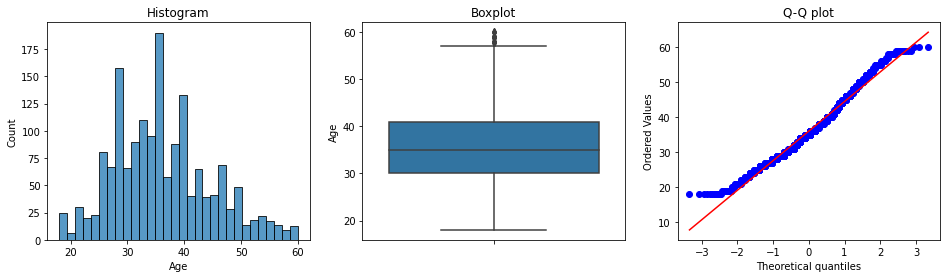

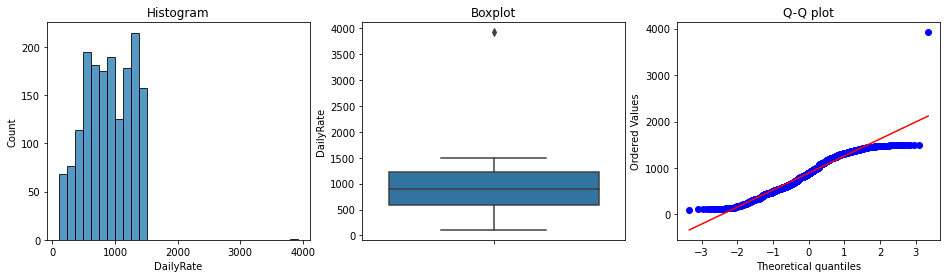

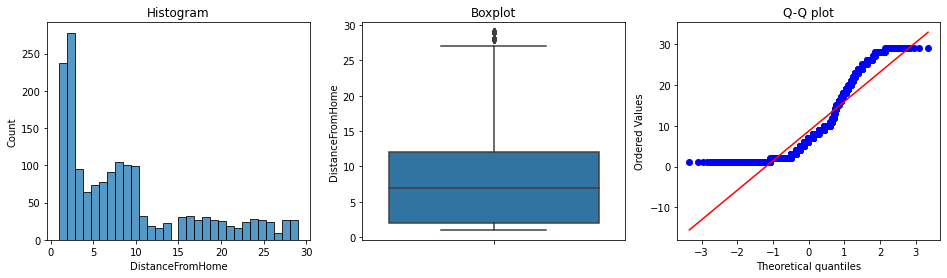

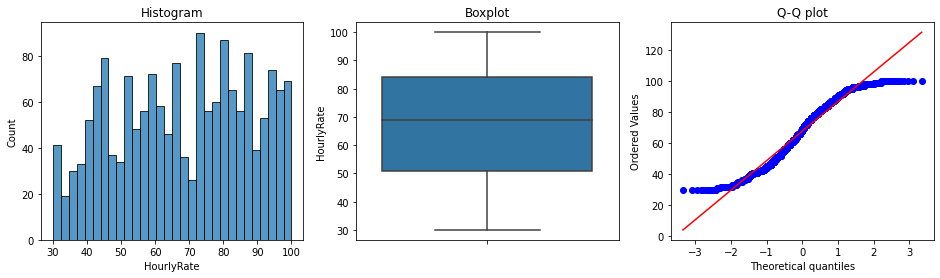

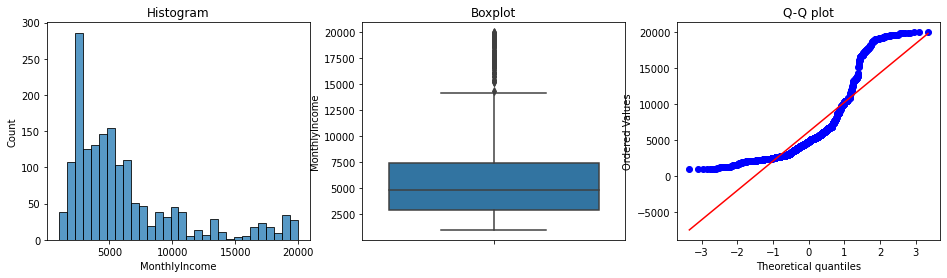

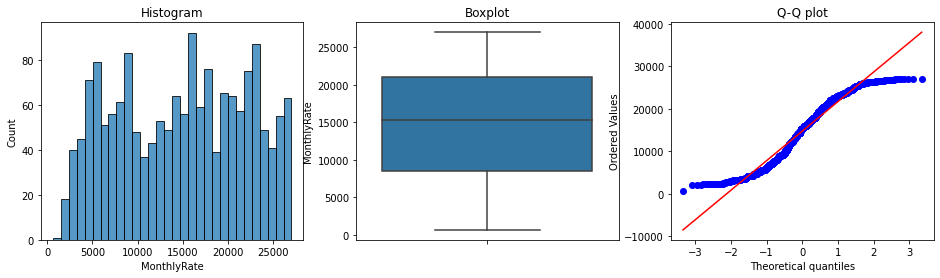

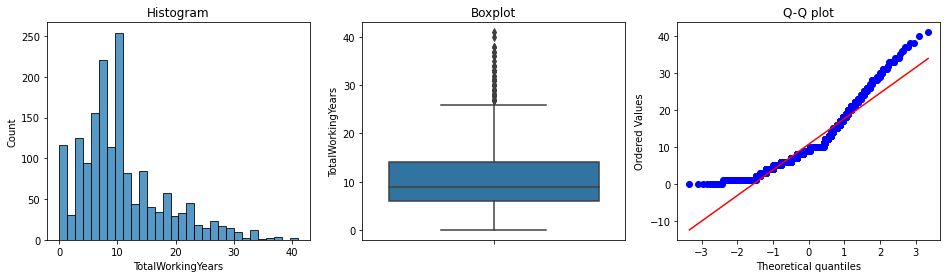

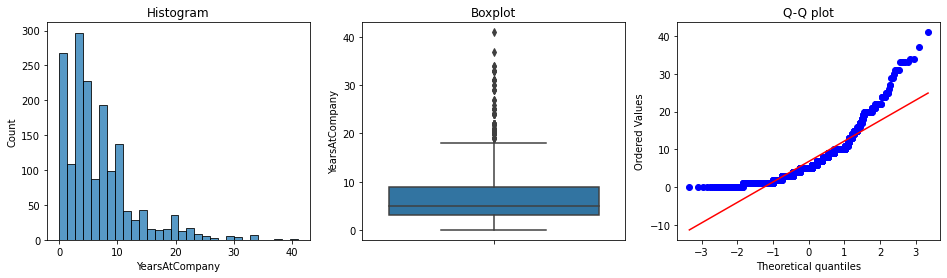

In [189]:
for var in continuous:
    diagnostic_plots(data, var)

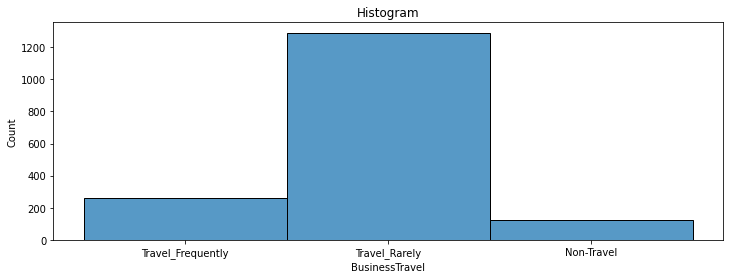

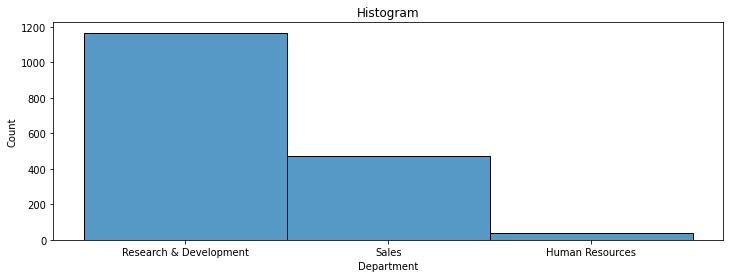

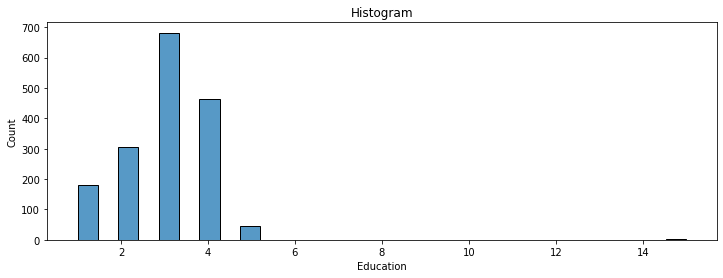

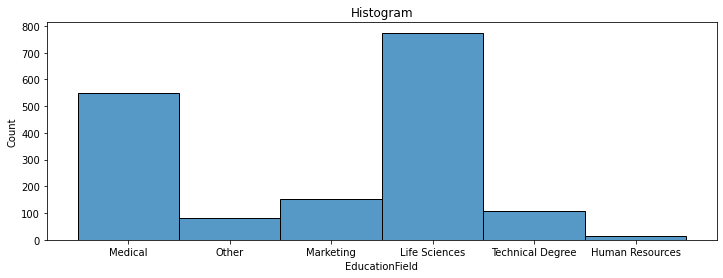

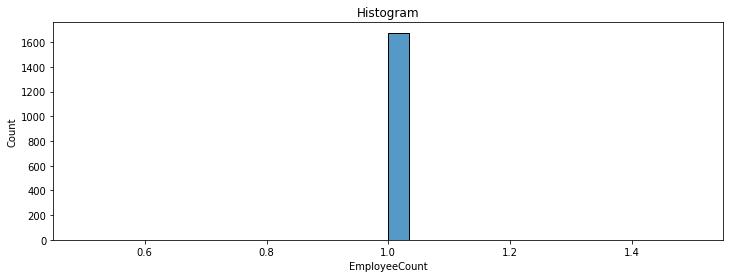

...

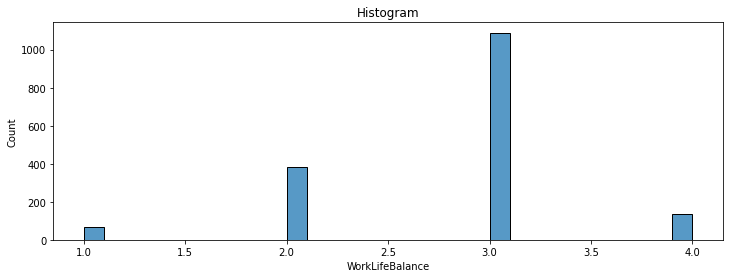

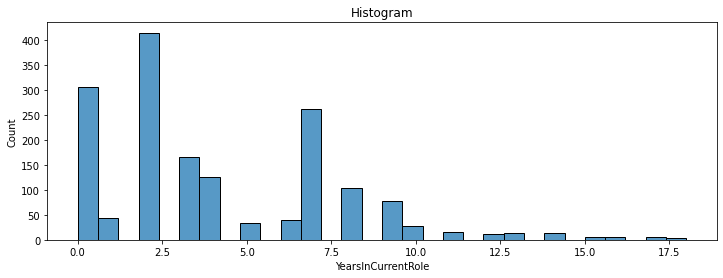

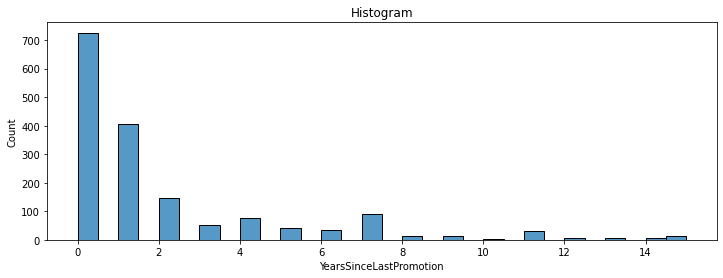

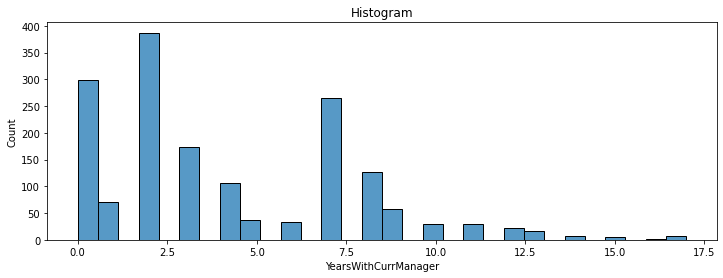

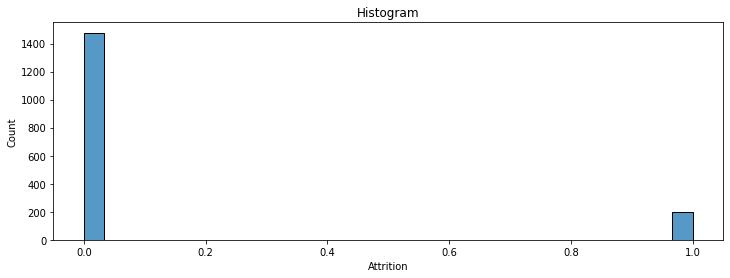

In [190]:
# histograms for discrete variables
for var in discrete:
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 1, 1)
    sns.histplot(data[var], bins=30)
    plt.title('Histogram')

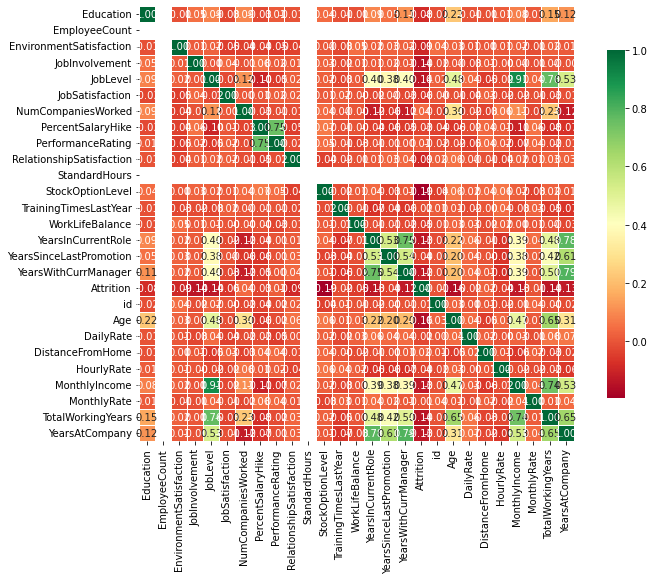

In [29]:
# We can check the correlation between every pair of attributes
# The correlation will be generated for the numerical data only
# we will use df.corr() to get correlatons and then use sns.heatmap to print the correlation matrix
corrmat = data[discrete + continuous].corr().round(2)
top_corr_features = corrmat.index
plt.figure(figsize=(12, 8))
sns.heatmap(data[top_corr_features].corr(),annot=True, square=True, fmt='.2f',
            cbar_kws={"shrink": .80}, linewidths=.5, cmap='RdYlGn');

In [30]:
data

,id,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,36,Travel_Frequently,599,Research & Development,24,3,Medical,1,4,...,80,1,10,2,3,10,0,7,8,0
1,1,35,Travel_Rarely,921,Sales,8,3,Other,1,1,...,80,1,4,3,3,4,2,0,3,0
2,2,32,Travel_Rarely,718,Sales,26,3,Marketing,1,3,...,80,2,4,3,3,3,2,1,2,0
3,3,38,Travel_Rarely,1488,Research & Development,2,3,Medical,1,3,...,80,0,15,1,1,6,0,0,2,0
4,4,50,Travel_Rarely,1017,Research & Development,5,4,Medical,1,2,...,80,0,31,0,3,31,14,4,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,1672,30,Travel_Rarely,945,Sales,1,3,Life Sciences,1,4,...,80,0,10,2,4,10,0,0,8,0
1673,1673,32,Travel_Rarely,1303,Research & Development,2,3,Life Sciences,1,1,...,80,1,10,3,4,4,2,1,3,0
1674,1674,29,Travel_Frequently,1184,Human Resources,24,3,Human Resources,1,2,...,80,0,1,2,3,1,0,0,0,1
1675,1675,36,Travel_Rarely,441,Sales,9,2,Marketing,1,2,...,80,2,10,3,2,10,3,0,8,0


In [156]:
data.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition'],
      dtype='object')

In [26]:
X = data[['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome', 'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 
         'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']]

In [27]:
X_test = test_data[['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome', 'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 
         'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']]

In [28]:
y = data[['Attrition']]

In [9]:
X.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole',
       'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [10]:
X_test.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole',
       'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [116]:
y

,Attrition
0,0
1,0
2,0
3,0
4,1
...,...
1672,0
1673,0
1674,1
1675,0


In [11]:
print(f"{100 * y.value_counts(normalize=True)} ")

Attrition
0            88.073942
1            11.926058
dtype: float64 


In [51]:
from feature_engine.encoding import OneHotEncoder
from feature_engine.encoding import RareLabelEncoder
from feature_engine.selection import DropFeatures
from sklearn.preprocessing import LabelEncoder

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import RepeatedStratifiedKFold

from feature_engine.transformation import LogTransformer
from feature_engine.transformation import YeoJohnsonTransformer

from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.outliers import Winsorizer

from xgboost import XGBClassifier

In [30]:
outlier_cols = ['Age', 'DailyRate', 'DistanceFromHome', 'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany']
one_hot_encoder_cols = ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']
yeo_transformer_cols = ['DailyRate', 'DistanceFromHome', 'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany']

preprocessing_pipeline_train = Pipeline([
    ('one_hot_encoder', OneHotEncoder(variables = one_hot_encoder_cols, drop_last=True, ignore_format=True)),
    ('yeo_transformer', YeoJohnsonTransformer(variables=yeo_transformer_cols)),
    ('outlier', Winsorizer(capping_method='gaussian', tail='both', fold=3, variables=outlier_cols)),
    ('scalar', SklearnTransformerWrapper(StandardScaler(), variables=continuous)),
])

In [31]:
preprocessing_pipeline_train.fit(X)

Pipeline(steps=[('one_hot_encoder',
                 OneHotEncoder(drop_last=True, ignore_format=True,
                               variables=['BusinessTravel', 'Department',
                                          'EducationField', 'Gender', 'JobRole',
                                          'MaritalStatus', 'OverTime'])),
                ('yeo_transformer',
                 YeoJohnsonTransformer(variables=['DailyRate',
                                                  'DistanceFromHome',
                                                  'MonthlyIncome',
                                                  'TotalWorkingYears',
                                                  'YearsAtCompany'])),
                ('outlier',
                 Winsorizer(tail='both',
                            variables=['Age', 'DailyRate', 'DistanceFromHome',
                                       'MonthlyIncome', 'TotalWorkingYears',
                                       'YearsAtCompany'])),
     

In [32]:
X_train = preprocessing_pipeline_train.transform(X)
X_test = preprocessing_pipeline_train.transform(X_test)

In [16]:
X_train

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,JobRole_Sales Representative,JobRole_Sales Executive,JobRole_Healthcare Representative,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Scientist,JobRole_Human Resources,MaritalStatus_Married,MaritalStatus_Divorced,OverTime_Yes
0,-0.004347,-0.767978,1.509449,3,4,-1.327755,3,1,4,-1.022369,...,0,0,0,0,0,0,0,1,0,1
1,-0.121931,0.112804,0.323265,3,1,-1.121889,3,1,1,-0.824641,...,1,0,0,0,0,0,0,1,0,0
2,-0.474682,-0.435646,1.597394,3,3,0.627971,3,2,4,-0.040141,...,0,1,0,0,0,0,0,0,1,0
3,0.230820,1.559073,-0.991963,3,3,-1.430688,3,2,1,0.186110,...,0,0,1,0,0,0,0,1,0,0
4,1.641826,0.365533,-0.157292,4,2,-1.585087,3,5,1,1.882787,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,-0.709850,0.176348,-1.488020,3,4,0.267705,3,3,3,0.898635,...,0,1,0,0,0,0,0,0,0,0
1673,-0.474682,1.098361,-0.991963,3,1,-1.018956,3,1,2,-0.477317,...,0,0,0,0,0,1,0,1,0,0
1674,-0.827434,0.796772,1.509449,3,2,-1.636553,2,1,1,-0.883797,...,0,0,0,0,0,0,1,1,0,1
1675,-0.004347,-1.225588,0.447219,2,2,-1.018956,4,2,3,0.202975,...,0,1,0,0,0,0,0,0,1,0


In [17]:
X_test

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,JobRole_Sales Representative,JobRole_Sales Executive,JobRole_Healthcare Representative,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Scientist,JobRole_Human Resources,MaritalStatus_Married,MaritalStatus_Divorced,OverTime_Yes
0,-2.003271,0.300083,-1.488020,1,4,-1.276288,3,1,3,-1.230467,...,0,0,0,0,0,0,0,0,0,0
1,1.053907,0.673834,-0.375221,4,3,-0.041093,3,2,1,0.225486,...,0,1,0,0,0,0,0,0,1,1
2,0.113237,-2.133131,0.840553,3,4,-1.379221,3,1,4,-0.924400,...,0,0,0,0,0,1,0,0,1,1
3,-0.474682,-0.518578,-1.488020,4,3,1.091169,2,2,3,0.151389,...,0,0,1,0,0,0,0,0,0,0
4,-0.827434,-1.157594,0.447219,1,3,0.576504,3,1,4,-2.511132,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1114,-0.592266,-0.334086,-1.488020,1,3,0.679437,2,1,4,-0.022730,...,1,0,0,0,0,0,0,0,1,0
1115,0.465988,-0.613238,1.597394,5,3,1.451434,2,2,4,0.414866,...,0,0,0,0,0,0,0,1,0,0
1116,0.701155,0.014343,-1.488020,4,2,-0.144026,3,2,1,0.154344,...,0,0,1,0,0,0,0,1,0,0
1117,-1.297769,1.512178,-1.488020,2,3,0.010373,2,2,4,0.017662,...,0,1,0,0,0,0,0,1,0,0


In [19]:
xgb = XGBClassifier()


xgb_param = {
            'max_depth' : [2,4,6],
            'n_estimators' : [50,100,150],
            'learning_rate' : [0.1,0.5,0.6,0.8],
            'min_child_weight' : [1,3,5,7],
            'subsample':[0.6,0.7,0.8,0.9,1]
             }

xgb_grid = GridSearchCV(xgb, param_grid=xgb_param,cv=5, return_train_score=True)

In [203]:
xgb_grid.fit(X_train, y)

[02:07:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:07:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:07:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:07:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

In [204]:
print(f'Best Mean Cross Validation Score is {xgb_grid.best_score_}')
print(f'Best Mean Cross Validation Score is {xgb_grid.best_params_}')
print(f'Train score is {xgb_grid.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8962437810945273
Best Mean Cross Validation Score is {'learning_rate': 0.1, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 150, 'subsample': 0.8}
Train score is 0.924865831842576


In [212]:
attrition_probabilities = xgb_grid.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_1.csv', index=False)

In [205]:
test_data

,id,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1677,19,Non-Travel,992,Research & Development,1,1,Medical,1,4,...,4,80,0,1,2,2,1,0,0,0
1,1678,45,Travel_Rarely,1136,Sales,4,4,Marketing,1,3,...,3,80,1,7,3,3,2,2,2,2
2,1679,37,Travel_Rarely,155,Research & Development,13,3,Life Sciences,1,4,...,2,80,2,13,2,2,7,7,1,7
3,1680,32,Travel_Rarely,688,Research & Development,1,4,Life Sciences,1,3,...,3,80,0,14,2,2,14,10,11,8
4,1681,29,Travel_Frequently,464,Research & Development,9,1,Life Sciences,1,3,...,1,80,0,1,5,3,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1114,2791,31,Travel_Rarely,755,Sales,1,1,Life Sciences,1,3,...,3,80,1,1,1,3,1,0,0,0
1115,2792,40,Travel_Rarely,654,Research & Development,26,5,Medical,1,3,...,4,80,1,20,4,3,20,10,1,8
1116,2793,42,Travel_Frequently,884,Research & Development,1,4,Medical,1,2,...,1,80,1,10,2,2,5,3,0,2
1117,2794,25,Travel_Frequently,1469,Sales,1,2,Technical Degree,1,3,...,4,80,1,5,2,3,4,2,1,3


In [209]:
attrition_probabilities = xgb_grid.predict_proba(X_test)[:, 1] 

In [210]:
attrition_probabilities

array([0.22323869, 0.0886904 , 0.02750504, ..., 0.01932879, 0.02045922,
       0.00756494], dtype=float32)

In [213]:
xgb_param_2 = {
    'learning_rate': [0.05, 0.1, 0.15],  # Adjusted around the best value (0.1)
    'max_depth': [1, 2, 3],  # Adjusted around the best value (2)
    'min_child_weight': [1, 2],  # Adjusted around the best value (1)
    'n_estimators': [125, 150, 175],  # Adjusted around the best value (150)
    'subsample': [0.75, 0.8, 0.85]  # Adjusted around the best value (0.8)
}

xgb_grid_2 = GridSearchCV(xgb, param_grid=xgb_param_2, cv=5, return_train_score=True)

In [214]:
xgb_grid_2.fit(X_train, y)

[03:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

In [215]:
print(f'Best Mean Cross Validation Score is {xgb_grid_2.best_score_}')
print(f'Best Mean Cross Validation Score is {xgb_grid_2.best_params_}')
print(f'Train score is {xgb_grid_2.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8974378109452736
Best Mean Cross Validation Score is {'learning_rate': 0.1, 'max_depth': 1, 'min_child_weight': 2, 'n_estimators': 150, 'subsample': 0.85}
Train score is 0.8998211091234347


In [216]:
attrition_probabilities = xgb_grid_2.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_2.csv', index=False)

In [217]:
xgb_param_3 = {
    'learning_rate': [0.05, 0.1, 0.15],
    'max_depth': [2, 3, 4],
    'min_child_weight': [1, 2, 3],
    'n_estimators': [125, 150, 175],
    'subsample': [0.7, 0.8, 0.9],
    'scale_pos_weight': [1, 5, 10] 
}

xgb_grid_3 = GridSearchCV(xgb, param_grid=xgb_param_3, cv=5, return_train_score=True)

In [218]:
xgb_grid_3.fit(X_train, y)

[03:46:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:46:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:46:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[03:46:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [219]:
print(f'Best Mean Cross Validation Score is {xgb_grid_3.best_score_}')
print(f'Best Mean Cross Validation Score is {xgb_grid_3.best_params_}')
print(f'Train score is {xgb_grid_3.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8962473347547973
Best Mean Cross Validation Score is {'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 175, 'scale_pos_weight': 1, 'subsample': 0.8}
Train score is 0.9344066785927251


In [220]:
attrition_probabilities = xgb_grid_3.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_3.csv', index=False)

In [222]:
xgb_param_4 = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2],
    'n_estimators': [175, 200, 225],
    'subsample': [0.7, 0.8, 0.9],
    'scale_pos_weight': [1, 2, 3],
    'gamma': [0, 0.1, 0.2],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

xgb_random_1 = RandomizedSearchCV(xgb, param_distributions=xgb_param_4, cv=5, return_train_score=True)

In [223]:
xgb_random_1.fit(X_train, y)

[04:44:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:44:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:44:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100,...
                                           scale_pos_weight=None,
                                           subsample=None, tree_method=None,
                                      

In [224]:
print(f'Best Mean Cross Validation Score is {xgb_random_1.best_score_}')
print(f'Best Mean Cross Validation Score is {xgb_random_1.best_params_}')
print(f'Train score is {xgb_random_1.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8884968017057568
Best Mean Cross Validation Score is {'subsample': 0.7, 'scale_pos_weight': 2, 'n_estimators': 225, 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 0.7}
Train score is 0.9266547406082289


In [225]:
attrition_probabilities = xgb_random_1.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_4.csv', index=False)

In [20]:
xgb_param_5 = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2],
    'n_estimators': [175, 200, 225],
    'subsample': [0.7, 0.8, 0.9],
    'scale_pos_weight': [1, 2, 3],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

xgb_grid_4 = GridSearchCV(xgb, param_grid=xgb_param_5, cv=5, return_train_score=True)

In [21]:
xgb_grid_4.fit(X_train, y)

[12:15:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:15:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:15:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:15:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

KeyboardInterrupt: 

In [33]:
xgb_param_6 = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2],
    'n_estimators': [175, 200, 225],
    'subsample': [0.7, 0.8, 0.9],
    'scale_pos_weight': [1, 2, 3]
}

xgb_grid_6 = GridSearchCV(xgb, param_grid=xgb_param_6, cv=5, return_train_score=True)

In [34]:
xgb_grid_6.fit(X_train, y)

[00:47:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:47:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:47:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:47:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, va

In [35]:
attrition_probabilities = xgb_grid_6.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_5.csv', index=False)

In [36]:
xgb_1 = XGBClassifier(
    learning_rate=0.05,
    max_depth=3,
    min_child_weight=1,
    n_estimators=175,
    scale_pos_weight=1,
    subsample=0.8
)

In [47]:
folds = StratifiedShuffleSplit(n_splits = 5, random_state=42, test_size=0.4)

grid = GridSearchCV(xgb_1, cv = folds, param_grid = xgb_param_6, return_train_score = True)

In [48]:
grid.fit(X_train, y)

[05:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[05:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[05:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[05:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=0.4,
            train_size=None),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=0.05, max_delta_step=None,
                                     max_depth=3, min_chi...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=1, subsample=0.8,
                                     tree_method=None, validate_parameters=None,
                                     verbos

In [49]:
print(f'Best Mean Cross Validation Score is {grid.best_score_}')
print(f'Best Mean Cross Validation Score is {grid.best_params_}')
print(f'Train score is {grid.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8903129657228017
Best Mean Cross Validation Score is {'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 175, 'scale_pos_weight': 1, 'subsample': 0.8}
Train score is 0.9314251639833036


In [50]:
attrition_probabilities = grid.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_6.csv', index=False)

In [52]:
folds_1 = RepeatedStratifiedKFold(n_splits = 5, random_state = 42, n_repeats=1)

grid_1 = GridSearchCV(xgb, cv = folds_1, param_grid = xgb_param_6, return_train_score = True)

In [53]:
grid_1.fit(X_train, y)

[07:59:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:59:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:59:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[07:59:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=1, n_splits=5, random_state=42),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None...
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, validate_parameters=None,
                                     verbosity=None)

In [54]:
print(f'Best Mean Cross Validation Score is {grid_1.best_score_}')
print(f'Best Mean Cross Validation Score is {grid_1.best_params_}')
print(f'Train score is {grid_1.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8938521677327648
Best Mean Cross Validation Score is {'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 225, 'scale_pos_weight': 1, 'subsample': 0.7}
Train score is 0.9940369707811568


In [55]:
attrition_probabilities = grid_1.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_7.csv', index=False)

In [62]:
from imblearn.pipeline import Pipeline as imb_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NeighbourhoodCleaningRule as NCR

In [57]:
pipe_rand_smote = imb_pipeline([('smote', SMOTE()), ('model', XGBClassifier())])
param_grid_1 = {
    # try different feature engineering parameters
    'smote__k_neighbors': [1,2,3,4,5],
    'model__max_depth': [2,3,4,5,6],
}

In [58]:
grid_smote= GridSearchCV(pipe_rand_smote, param_grid=param_grid_1, cv=5, n_jobs=2, scoring='roc_auc')

In [59]:
grid_smote.fit(X_train, y)

[00:59:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('smote', SMOTE()),
                                       ('model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                                      importance_type='gain',
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                          

In [60]:
print(f'Best Mean Cross Validation Score is {grid_smote.best_score_}')
print(f'Best Mean Cross Validation Score is {grid_smote.best_params_}')
print(f'Train score is {grid_smote.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8054217246907924
Best Mean Cross Validation Score is {'model__max_depth': 6, 'smote__k_neighbors': 5}
Train score is 1.0


In [61]:
attrition_probabilities = grid_smote.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_8.csv', index=False)

In [64]:
pipeline_undersampling = imb_pipeline([('ncr',NCR()),('model',xgb)])
param_grid_2 = {
              "ncr__n_neighbors":[4,12]
             }
grid_2 = GridSearchCV(pipeline_undersampling, param_grid=param_grid_2, cv=5, return_train_score=True,scoring= 'roc_auc')

In [65]:
grid_2.fit(X_train, y)

[01:05:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('ncr', NeighbourhoodCleaningRule()),
                                       ('model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                                      importance_type='gain',
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                        

In [66]:
print(f'Best Mean Cross Validation Score is {grid_2.best_score_}')
print(f'Best Mean Cross Validation Score is {grid_2.best_params_}')
print(f'Train score is {grid_2.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8088150480989462
Best Mean Cross Validation Score is {'ncr__n_neighbors': 12}
Train score is 0.9763067027758972


In [67]:
attrition_probabilities = grid_2.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_9.csv', index=False)

In [68]:
pipe_rand_smote_1 = imb_pipeline([('smote', SMOTE()), ('model', XGBClassifier())])


param_grid_3 = {
    'smote__k_neighbors': [1, 2, 3, 4, 5],
    'model__max_depth': [2, 3, 4, 5, 6],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__n_estimators': [100, 150, 200],
    'model__subsample': [0.7, 0.8, 0.9],
    'smote__sampling_strategy': ['auto', 0.5, 0.75, 1.0]  # Adjust oversampling strategy
}

In [69]:
grid_3 = GridSearchCV(pipe_rand_smote_1, param_grid=param_grid_3, cv=5, return_train_score=True, scoring='roc_auc')

In [70]:
grid_3.fit(X_train, y)

[01:20:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('smote', SMOTE()),
                                       ('model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                                      importance_type='gain',
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                          

In [71]:
print(f'Best Mean Cross Validation Score is {grid_3.best_score_}')
print(f'Best Mean Cross Validation Score is {grid_3.best_params_}')
print(f'Train score is {grid_3.score(X_train,y)}')

Best Mean Cross Validation Score is 0.8238568483737975
Best Mean Cross Validation Score is {'model__learning_rate': 0.05, 'model__max_depth': 6, 'model__n_estimators': 150, 'model__subsample': 0.7, 'smote__k_neighbors': 1, 'smote__sampling_strategy': 0.5}
Train score is 0.9997088693297225


In [72]:
attrition_probabilities = grid_3.predict_proba(X_test)[:, 1]  # Predict probabilities for the positive class

# Create a DataFrame for submission
submission = pd.DataFrame({
    'id': test_data['id'],  # Assuming 'EmployeeNumber' is a column in your test data
    'Attrition': attrition_probabilities
})

# Save the submission file
submission.to_csv('attrition_predictions_10.csv', index=False)